### Necessary Packages

In [1]:
import sys
import os
import seaborn as sns
import pandas as pd
sys.path.append('..')
import torch
import definitions as D
import matplotlib.pyplot as plt
from src.models import Generator
from src.utils import get_last_checkpoint,load_json
from src.training.gan import Config
from src.utils import make_grid,seed_everything
from IPython import display

In [2]:
sns.set_theme(style="darkgrid",palette='husl')

### Reproducibility

In [3]:
SEED = 14
seed_everything(SEED)

In [4]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
EXPIREMENT = 'gan'
CONFIG_PATH = os.path.join(D.EXPERIMENTS_DIR,EXPIREMENT,'config.json')

In [5]:
config = Config(**load_json(CONFIG_PATH))

In [6]:
CHECKPOINT_PATH = os.path.join(D.EXPERIMENTS_DIR,EXPIREMENT,'checkpoints')
CHECKPOINT = get_last_checkpoint(CHECKPOINT_PATH)['generator']
model = Generator(config.gan_config).to(DEVICE).eval()
model.load_state_dict(CHECKPOINT,strict=True)

<All keys matched successfully>

### History

In [7]:
history_path = os.path.join(D.EXPERIMENTS_DIR, EXPIREMENT, 'history.csv')
history = pd.read_csv(history_path)

In [8]:
history.head()

,epoch,g_loss,d_loss,d_real,d_fake
0,0,3.288094,0.442121,0.444795,0.439446
1,1,3.115804,0.422301,0.428797,0.415806
2,2,3.086083,0.413320,0.416925,0.409714
3,3,3.075766,0.399358,0.403646,0.395070
4,4,3.051741,0.388750,0.390689,0.386810


<Axes: xlabel='epoch', ylabel='g_loss'>

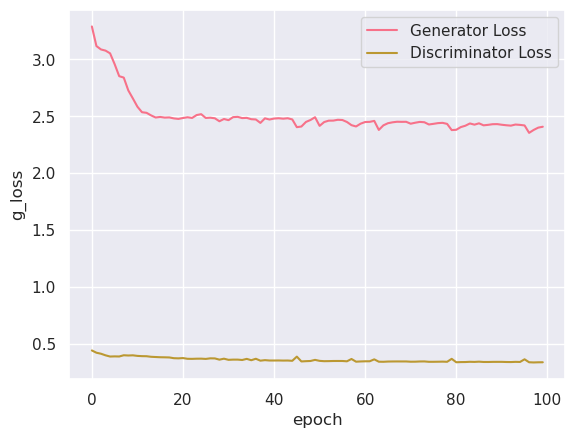

In [9]:
ax = sns.lineplot(data=history, x='epoch', y='g_loss', label='Generator Loss')
sns.lineplot(data=history, x='epoch', y='d_loss', label='Discriminator Loss', ax=ax)

In [10]:
gif_path = os.path.join(D.EXPERIMENTS_DIR, EXPIREMENT, 'images.gif')

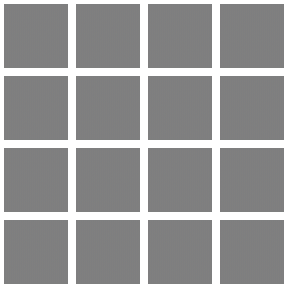

In [11]:
display.Image(filename=gif_path)

### Generate fake images

In [12]:
noise = torch.randn(16, config.gan_config.latent_dim, 1, 1).to(DEVICE)
images = model.generate(noise).cpu()

In [13]:
images = make_grid(images,h=config.grid_size,w=config.grid_size,gap_value=1.0)

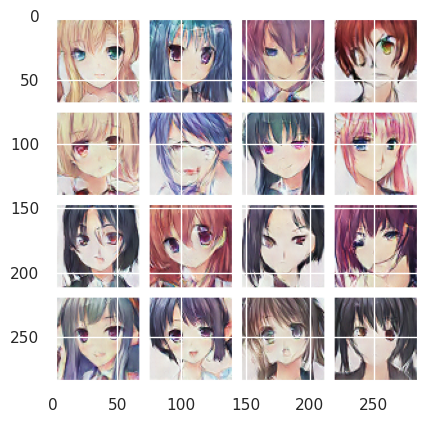

In [14]:
plt.imshow(images)